## 1. Importação de Biblotecas de Apoio

In [1]:
#### Será necessário a instalação do pacote

# !pip install --upgrade pip --user
# !pip install -U imbalanced-learn --user
# !pip install imblearn --user
# !conda install -c glemaitre imbalanced-learn -y

# !pip install graphviz --user

# Caso tenha erro com o graphviz, você deve configurá-lo no seu SO:
# sudo apt install graphviz
# https://stackoverflow.com/questions/35064304/runtimeerror-make-sure-the-graphviz-executables-are-on-your-systems-path-aft

## 2. Preparação do Ambiente

In [2]:
# Carrega as bibliotecas de ambiente

import os
import io
import requests
import collections

path = os.getcwd()

In [3]:
# Carrega as bibliotecas de ciências e gráficos

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
import warnings
from sklearn import metrics

warnings.filterwarnings('ignore')
%matplotlib inline

## 3. Coleta de Dados

### Origem: https://archive.ics.uci.edu/ml/datasets/diabetes

In [4]:
# Carrega o arquivo csv e nomeia as colunas

pima = pd.read_csv('diabetes.csv', 
                   header = None, sep = ",",
                   names=['Pregnancy', 'Glucose', 'BloodPressure' ,'SkinfoldThickness', 'Insulin', 'BodyMassIndex', 'DiabetesPedigreeFunction', 'Age', 'Class'])   

In [5]:
# Imprime as cinco primeiras linhas do arquivo

pima.head(5)

,Pregnancy,Glucose,BloodPressure,SkinfoldThickness,Insulin,BodyMassIndex,DiabetesPedigreeFunction,Age,Class
1,6,148,72,35,0,33.6,0.627,50,1
2,1,85,66,29,0,26.6,0.351,31,0
3,8,183,64,0,0,23.3,0.672,32,1
4,1,89,66,23,94,28.1,0.167,21,0
5,0,137,40,35,168,43.1,2.288,33,1


In [6]:
# Copia meu dataframe para uma variável de uso

df = pima.copy()

## 4. Processamento/Tratamento de Dados

In [7]:
# Verificação das caracteristicas de cada coluna do arquivo

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 768 entries, 1 to 768
Data columns (total 9 columns):
Pregnancy                   768 non-null int64
Glucose                     768 non-null int64
BloodPressure               768 non-null int64
SkinfoldThickness           768 non-null int64
Insulin                     768 non-null int64
BodyMassIndex               768 non-null float64
DiabetesPedigreeFunction    768 non-null float64
Age                         768 non-null int64
Class                       768 non-null int64
dtypes: float64(2), int64(7)
memory usage: 60.0 KB


In [8]:
# Verifica os dados carregados

df.describe() 

,Pregnancy,Glucose,BloodPressure,SkinfoldThickness,Insulin,BodyMassIndex,DiabetesPedigreeFunction,Age,Class
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [9]:
# Verifica se exitem dados nulos por coluna

df[df.isnull().any(axis=1)] 

,Pregnancy,Glucose,BloodPressure,SkinfoldThickness,Insulin,BodyMassIndex,DiabetesPedigreeFunction,Age,Class


In [10]:
# Verifica se exitem dados nulos no geral

df.isnull().values.any() 

False

## 5. Análise e Exploração dos Dados

### 5.1 Análise dos Dados

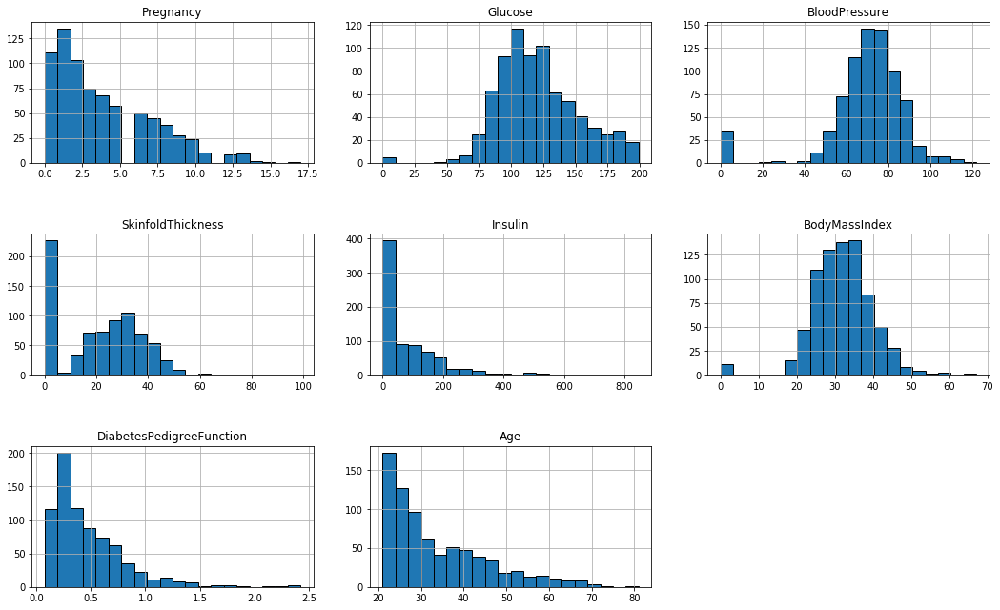

In [11]:
# Gráfico com os dados de cada coluna

columns=df.columns[:8]
plt.subplots(figsize=(18,15))
length=len(columns)
for i,j in zip(columns,range(length)):
    plt.subplot((length/2),3,j+1)
    plt.subplots_adjust(wspace=0.2,hspace=0.5)
    df[i].hist(bins=20,edgecolor='black')
    plt.title(i)
    
plt.show()

### 5.2 Análise de Casos de Diabetes

Pregnancy                      AxesSubplot(0.125,0.657941;0.227941x0.222059)
Glucose                     AxesSubplot(0.398529,0.657941;0.227941x0.222059)
BloodPressure               AxesSubplot(0.672059,0.657941;0.227941x0.222059)
SkinfoldThickness              AxesSubplot(0.125,0.391471;0.227941x0.222059)
Insulin                     AxesSubplot(0.398529,0.391471;0.227941x0.222059)
BodyMassIndex               AxesSubplot(0.672059,0.391471;0.227941x0.222059)
DiabetesPedigreeFunction          AxesSubplot(0.125,0.125;0.227941x0.222059)
Age                            AxesSubplot(0.398529,0.125;0.227941x0.222059)
Class                          AxesSubplot(0.672059,0.125;0.227941x0.222059)
dtype: object

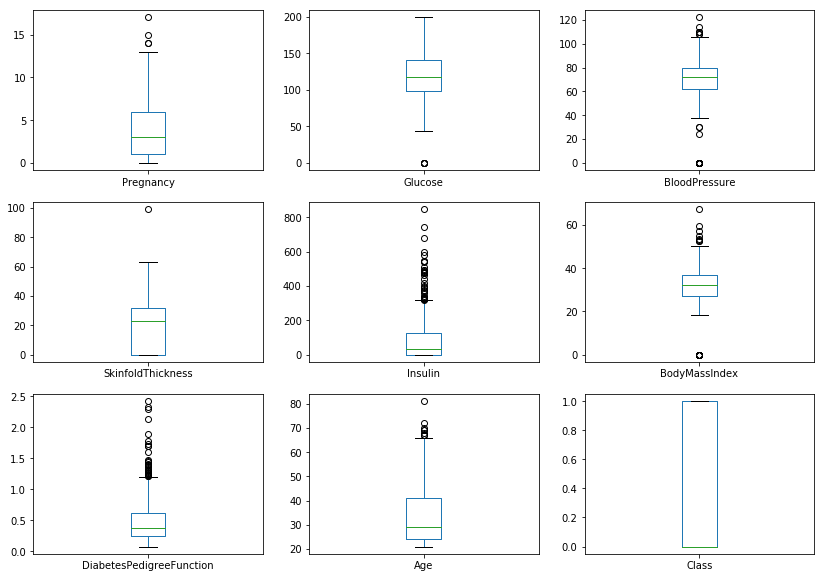

In [12]:
# Gráfico de boxplot para análise dos dados colunáres

df.plot(kind= 'box', subplots=True, layout=(3,3),figsize=(14,10))

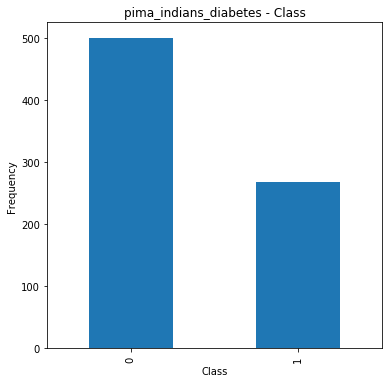

In [13]:
# Analise dos dados relacionados a variável target e a sua frequência

df['Class'].value_counts().plot(kind='bar', figsize=(6,6))
plt.title('pima_indians_diabetes - Class')
plt.xlabel('Class')
plt.ylabel('Frequency')

plt.show()

### 5.3 - Relacionamento Entre Atributos

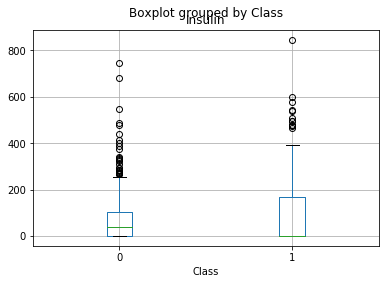

In [14]:
# Gráfico de boxplot por relacionamento entre Insulina e Classe

df.boxplot(column='Insulin',by='Class')

plt.show()

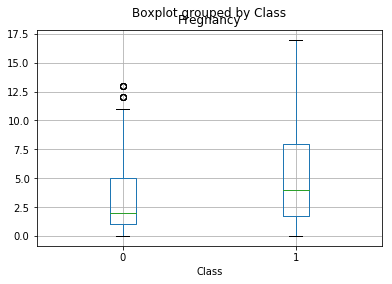

In [15]:
# Gráfico de boxplot por relacionamento entre Gravidez e Classe

df.boxplot(column='Pregnancy',by='Class')

plt.show()

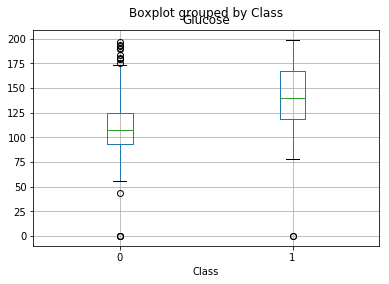

In [16]:
# Gráfico de boxplot por relacionamento entre Glicose e Classe

df.boxplot(column='Glucose',by='Class')

plt.show()

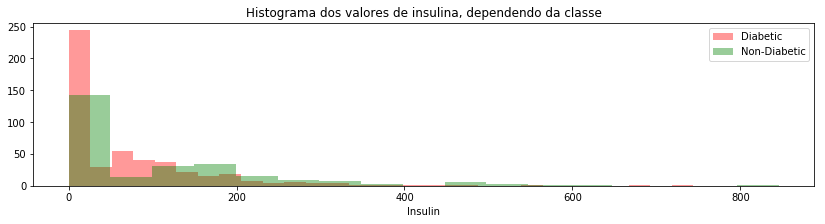

In [17]:
# Gráfico de relação entre a Insulina e a Classe(Diabético ou Não)

plt.figure(figsize=(14,3))
Insulin_plt = df.groupby(df['Insulin']).Class.count().reset_index()
sns.distplot(df[df.Class == 0]['Insulin'], color='red', kde=False, label='Diabetic')
sns.distplot(df[df.Class == 1]['Insulin'], color='green', kde=False, label='Non-Diabetic')
plt.legend()
plt.title('Histograma dos valores de insulina, dependendo da classe')

plt.show()

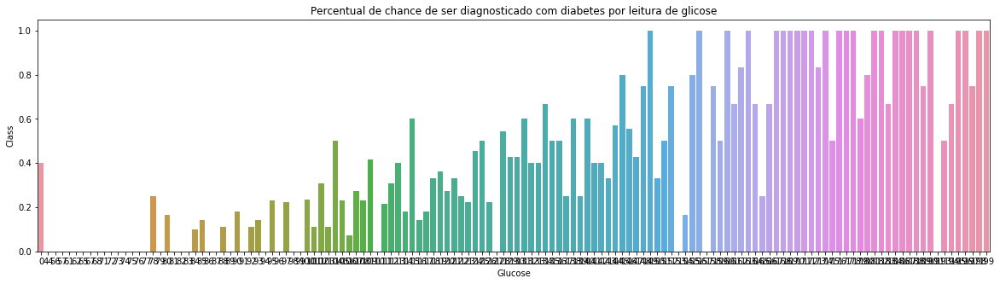

In [18]:
# Gráfico de relação entre a Glicose e a Classe(Diabético ou Não)

plt.figure(figsize=(20,5))
glucose_plt = df.groupby('Glucose').Class.mean().reset_index()
sns.barplot(glucose_plt.Glucose, glucose_plt.Class)
plt.title('Percentual de chance de ser diagnosticado com diabetes por leitura de glicose')

plt.show()

### 5.4 - Matrix de Correlação

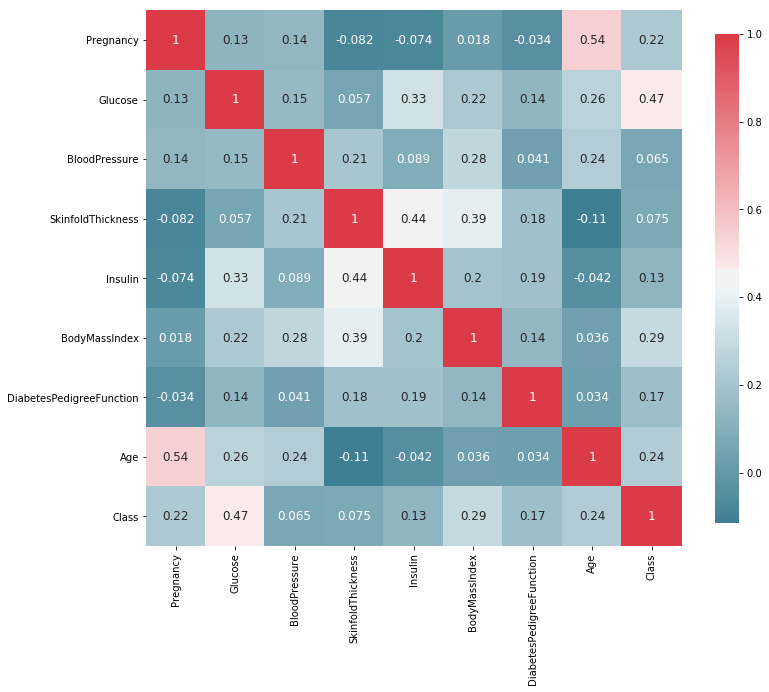

In [19]:
# Gráfico com a matrix de correlação entre as variáveis

corr = df.corr()
_ , ax = plt.subplots( figsize =( 12 , 10 ) )
cmap = sns.diverging_palette( 220 , 10 , as_cmap = True )
_ = sns.heatmap(corr, cmap = cmap, square=True, cbar_kws={ 'shrink' : .9 }, ax=ax, annot = True, annot_kws = {'fontsize' : 12 })

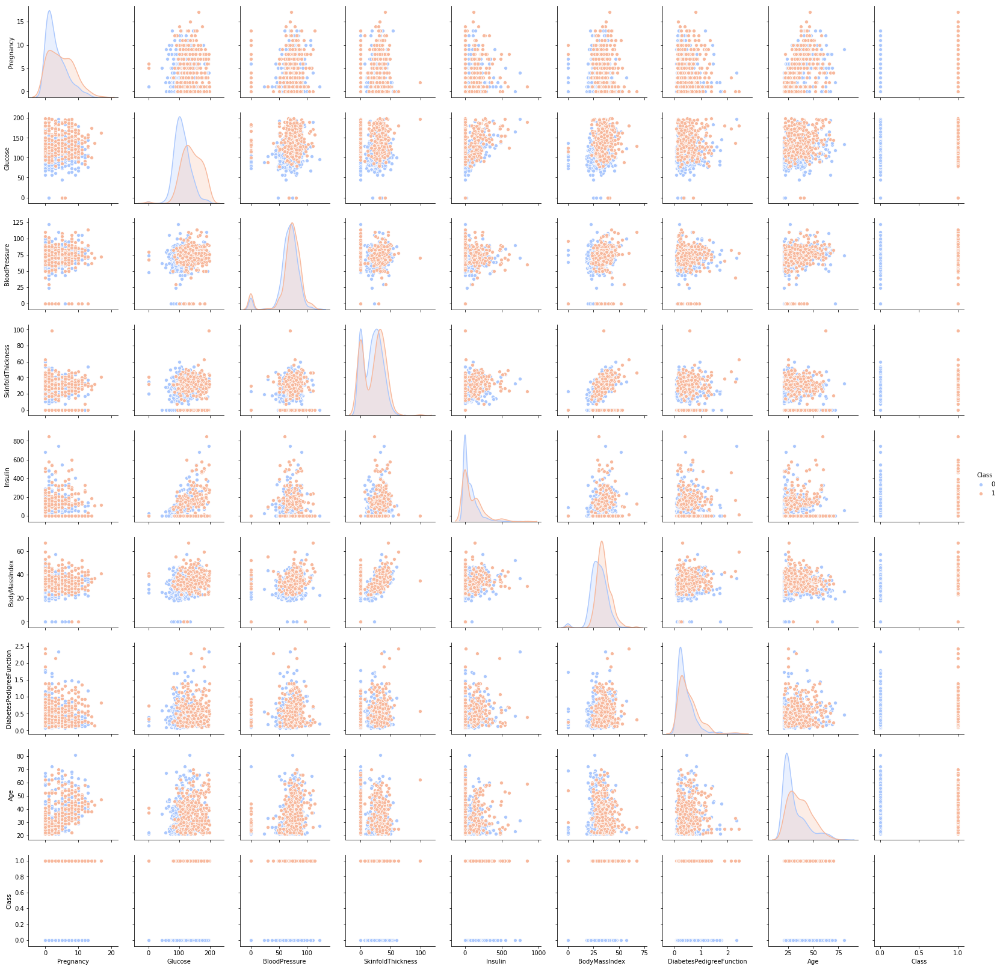

In [20]:
# Gráfico de relacionamento entre as colunas e suas correlações

import seaborn as sns

sns.pairplot(df,hue='Class',palette='coolwarm')

### 5.5 - Limpeza dos Dados

In [21]:
# Verificando valores como zero

print("Número de valores missing: " + repr(df[df.Glucose == 0].shape[0]))
print(df[df.Glucose == 0].groupby('Class')['Class'].count())

Número de valores missing: 5
Class
0    3
1    2
Name: Class, dtype: int64


In [22]:
# Substitua o valor zero pelo valor médio das classes

Glucose_0 = df[(df['Glucose']== 0)]
df[(df['Glucose']== 0) & (df['Class'] == 0)] = Glucose_0[Glucose_0['Class']== 0].replace(0, df[(df['Class']== 0)].mean())
df[(df['Glucose']== 0) & (df['Class'] == 1)] = Glucose_0[Glucose_0['Class']== 1].replace(0, df[(df['Class']== 1)].mean())

In [23]:
# Verificar valores zero

print("Número de valores missing: " + repr(df[df.BloodPressure == 0].shape[0]))
print(df[df.BloodPressure == 0].groupby('Class')['Class'].count())

Número de valores missing: 35
Class
0    19
1    16
Name: Class, dtype: int64


In [24]:
# Substitua o valor zero pelo valor médio das classes

BloodPressure_0 = df[(df['BloodPressure']== 0)]
df[(df['BloodPressure']== 0) & (df['Class'] == 0)] = BloodPressure_0[BloodPressure_0['Class']== 0].replace(0, df[(df['Class']== 0)].mean())
df[(df['BloodPressure']== 0) & (df['Class'] == 1)] = BloodPressure_0[BloodPressure_0['Class']== 1].replace(0, df[(df['Class']== 1)].mean())

In [25]:
# Verificar valores zero

print("Número de valores missing: " + repr(df[df.SkinfoldThickness == 0].shape[0]))
print(df[df.SkinfoldThickness == 0].groupby('Class')['Class'].count())

Número de valores missing: 194
Class
0    121
1     73
Name: Class, dtype: int64


In [26]:
# Substitua o valor zero pelo valor médio das classes

SkinfoldThickness_0 = df[(df['SkinfoldThickness']== 0)]
df[(df['SkinfoldThickness']== 0) & (df['Class'] == 0)] = SkinfoldThickness_0[SkinfoldThickness_0['Class']== 0].replace(0, df[(df['Class']== 0)].mean())
df[(df['SkinfoldThickness']== 0) & (df['Class'] == 1)] = SkinfoldThickness_0[SkinfoldThickness_0['Class']== 1].replace(0, df[(df['Class']== 1)].mean())

In [27]:
# Verificar valores zero
print("Número de casos anormais na espessura das dobras cutâneas: " + repr(df[df.SkinfoldThickness > 60].shape[0]))
print(df[df.SkinfoldThickness > 60]['SkinfoldThickness'])
print(df[df.SkinfoldThickness > 60].groupby('Class')['Class'].count())

Número de casos anormais na espessura das dobras cutâneas: 2
446    63.0
580    99.0
Name: SkinfoldThickness, dtype: float64
Class
1    2
Name: Class, dtype: int64


In [28]:
# Substituindo valor impossível com valor médio

df['SkinfoldThickness'].iloc[579] = df['SkinfoldThickness'].mean()

In [29]:
# Substitua o valor zero pelo valor médio das classes

print("Número de valores missing: " + repr(df[df.Insulin == 0].shape[0]))
print(df[df.Insulin == 0].groupby('Class')['Class'].count())

Número de valores missing: 141
Class
0    94
1    47
Name: Class, dtype: int64


In [30]:
# Verificar valores zero

Insulin_0 = df[(df['Insulin'] == 0)]
df[(df['Insulin']== 0) & (df['Class'] == 0)] = Insulin_0[Insulin_0['Class']== 0].replace(0, df[(df['Class']== 0)].mean())
df[(df['Insulin']== 0) & (df['Class'] == 1)] = Insulin_0[Insulin_0['Class']== 1].replace(0, df[(df['Class']== 1)].mean())

In [31]:
# Substitua o valor zero pelo valor médio das classes

print("Número de valores missing: " + repr(df[df.BodyMassIndex == 0].shape[0]))
print(df[df.BodyMassIndex == 0].groupby('Class')['Class'].count())

Número de valores missing: 1
Class
0    1
Name: Class, dtype: int64


In [32]:
# Substitua o valor zero pelo valor médio das classes

BodyMassIndex_0 = df[(df['BodyMassIndex']== 0)] 
df[(df['BodyMassIndex']== 0) & (df['Class'] == 0)] = BodyMassIndex_0[BodyMassIndex_0['Class']== 0].replace(0, df[(df['Class']== 0)].mean())
df[(df['BodyMassIndex']== 0) & (df['Class'] == 1)] = BodyMassIndex_0[BodyMassIndex_0['Class']== 1].replace(0, df[(df['Class']== 1)].mean())

### 5.6 - Avaliação Preliminar

In [33]:
# Avaliação preliminar dos dados estatísticos de cada coluna

df.describe() 

,Pregnancy,Glucose,BloodPressure,SkinfoldThickness,Insulin,BodyMassIndex,DiabetesPedigreeFunction,Age,Class
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,4.126263,121.691999,72.267826,26.770604,124.771038,32.441053,0.471876,33.240885,0.348958
std,3.202732,30.461151,12.115948,9.144460,91.935806,6.880054,0.331329,11.760232,0.476951
min,0.000000,44.000000,24.000000,7.000000,14.000000,18.200000,0.078000,21.000000,0.000000
25%,2.000000,99.750000,64.000000,20.371904,71.691720,27.500000,0.243750,24.000000,0.000000
50%,3.324384,117.000000,72.000000,23.404712,100.000000,32.050000,0.372500,29.000000,0.000000
75%,6.000000,141.000000,80.000000,32.000000,136.297569,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,63.000000,846.000000,67.100000,2.420000,81.000000,1.000000


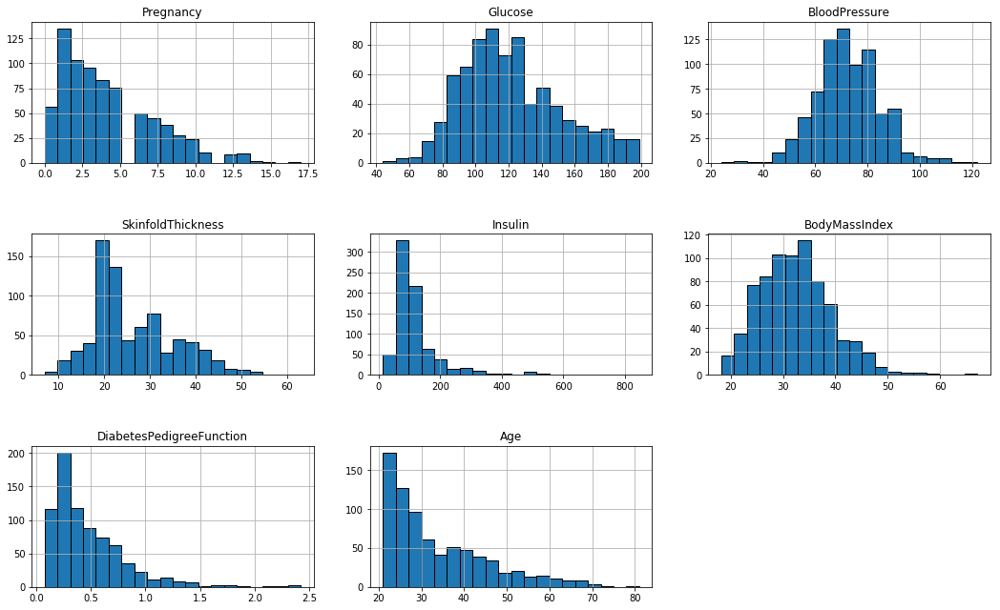

In [34]:
# Gráfico com os dados de cada coluna após a limpeza preliminar

columns=df.columns[:8]
plt.subplots(figsize=(18,15))
length=len(columns)
for i,j in zip(columns,range(length)):
    plt.subplot((length/2),3,j+1)
    plt.subplots_adjust(wspace=0.2,hspace=0.5)
    df[i].hist(bins=20,edgecolor='black')
    plt.title(i)
    
plt.show()

Pregnancy                      AxesSubplot(0.125,0.657941;0.227941x0.222059)
Glucose                     AxesSubplot(0.398529,0.657941;0.227941x0.222059)
BloodPressure               AxesSubplot(0.672059,0.657941;0.227941x0.222059)
SkinfoldThickness              AxesSubplot(0.125,0.391471;0.227941x0.222059)
Insulin                     AxesSubplot(0.398529,0.391471;0.227941x0.222059)
BodyMassIndex               AxesSubplot(0.672059,0.391471;0.227941x0.222059)
DiabetesPedigreeFunction          AxesSubplot(0.125,0.125;0.227941x0.222059)
Age                            AxesSubplot(0.398529,0.125;0.227941x0.222059)
Class                          AxesSubplot(0.672059,0.125;0.227941x0.222059)
dtype: object

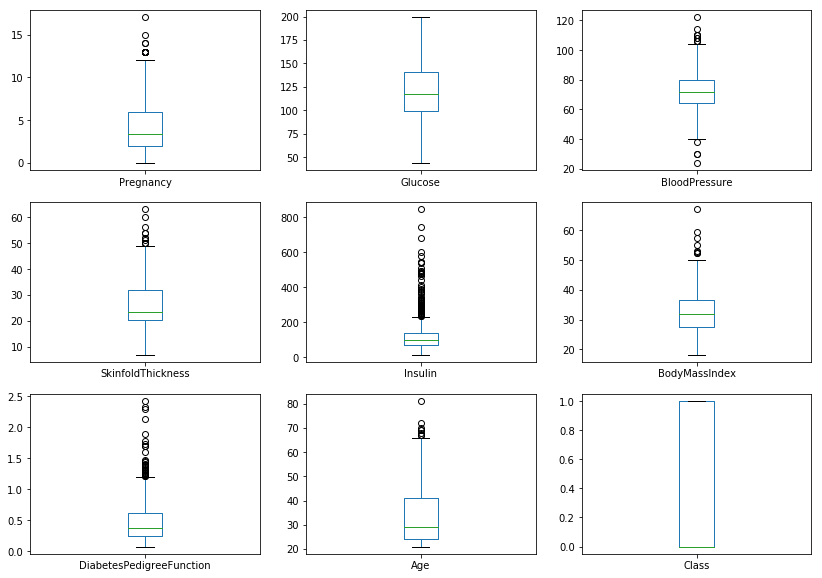

In [35]:
# Gráfico de boxplot para análise dos dados colunáres após a limpeza preliminar

df.plot(kind= 'box' , subplots=True, layout=(3,3),figsize=(14,10))

## 6. Preparração dos dados para aplicação dos Modelos de Machine Learning

In [36]:
# Contagem dos valores da variável target

df.Class.value_counts()

0    500
1    268
Name: Class, dtype: int64

In [37]:
# Criando a variável para manter a distribuição sempre padrão

random_state=1143795

In [38]:
from imblearn import under_sampling, over_sampling
from imblearn.over_sampling import SMOTE

In [39]:
# Dados de oversampling são indicados com um sufixo de 'o'

np.random.seed(48)
from imblearn.over_sampling import SMOTE, ADASYN
data_o, target_o = SMOTE().fit_sample(df, df.Class)

In [40]:
# Valida a quantidade de linhas e colunas das variávies preditoras

data_o.shape

(1000, 9)

In [41]:
# Valida a quantidade de linhas e colunas da variável alvo

target_o.shape

(1000,)

In [42]:
# Conta a quantidade de registros da variável alvo

collections.Counter(target_o)

Counter({1: 500, 0: 500})

In [43]:
from sklearn.model_selection import train_test_split

In [44]:
Xo_train, Xo_test, yo_train, yo_test = train_test_split(data_o, target_o, test_size=0.20, random_state=8)

In [45]:
Xo_train.shape

(800, 9)

In [46]:
yo_train.shape

(800,)

In [47]:
Xo_test.shape

(200, 9)

In [48]:
yo_test.shape

(200,)

In [49]:
data=df[df.columns[:8]]
target=df['Class']

In [50]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
cols = data.iloc[:, 0:8].columns
data[cols] = scaler.fit_transform(data)
data.head()

,Pregnancy,Glucose,BloodPressure,SkinfoldThickness,Insulin,BodyMassIndex,DiabetesPedigreeFunction,Age
1,0.352941,0.670968,0.489796,0.500000,0.146992,0.314928,0.234415,0.483333
2,0.058824,0.264516,0.428571,0.392857,0.090194,0.171779,0.116567,0.166667
3,0.470588,0.896774,0.408163,0.292941,0.111922,0.104294,0.253629,0.183333
4,0.058824,0.290323,0.428571,0.285714,0.096154,0.202454,0.038002,0.000000
5,0.000000,0.600000,0.163265,0.500000,0.185096,0.509202,0.943638,0.200000


In [51]:
# Preparação dos dados nas escalas de dispersão (caso necessário)

#data[cols] = preprocessing.scale(data)
preprocessing.scale(data)

array([[ 0.58542446,  0.86422032, -0.02211961, ...,  0.16855999,
         0.46849198,  1.4259954 ],
       [-0.9767601 , -1.2053356 , -0.51765738, ..., -0.84953697,
        -0.36506078, -0.19067191],
       [ 1.21029828,  2.01397361, -0.68283664, ..., -1.32949697,
         0.60439732, -0.10558415],
       ...,
       [ 0.27298755, -0.02273222, -0.02211961, ..., -0.90771394,
        -0.68519336, -0.27575966],
       [-0.9767601 ,  0.14151825, -1.01319515, ..., -0.34048849,
        -0.37110101,  1.17073215],
       [-0.9767601 , -0.94253485, -0.18729887, ..., -0.29685577,
        -0.47378505, -0.87137393]])

In [52]:
train,test=train_test_split(df,test_size=0.20,random_state=848,stratify=df['Class'])

X_train=train[train.columns[:8]]
X_test=test[test.columns[:8]]
y_train=train['Class']
y_test=test['Class']

# 7. Procura pelo melhor modelo de Machine Learning para resolver o problema

### 7.1 - K-Nearest Neighbours Classifier

In [53]:
from sklearn.neighbors import KNeighborsClassifier

In [54]:
knn = KNeighborsClassifier(n_neighbors=3)

In [55]:
knn.fit(Xo_train, yo_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=3, p=2,
           weights='uniform')

In [56]:
pred = knn.predict(Xo_test)

In [57]:
pred.shape

(200,)

In [58]:
from sklearn.metrics import confusion_matrix
print (confusion_matrix(yo_test,pred))

[[80 23]
 [11 86]]


In [59]:
from sklearn.metrics import classification_report

In [60]:
print (classification_report(yo_test,pred))

             precision    recall  f1-score   support

          0       0.88      0.78      0.82       103
          1       0.79      0.89      0.83        97

avg / total       0.84      0.83      0.83       200



### 7.2 - Normalização

In [61]:
from sklearn import preprocessing
data_on = preprocessing.scale(data_o)
Xon_train, Xon_test, yon_train, yon_test = train_test_split(data_on, target_o, test_size=0.20, random_state=4)

In [62]:
knn.fit(Xon_train, yon_train)
pred = knn.predict(Xon_test)
print (confusion_matrix(yon_test,pred))

[[103   0]
 [  0  97]]


In [63]:
print (classification_report(yon_test,pred))

             precision    recall  f1-score   support

          0       1.00      1.00      1.00       103
          1       1.00      1.00      1.00        97

avg / total       1.00      1.00      1.00       200



### 7.3 - K-value Optimisation

Text(0, 0.5, 'Error Rate')

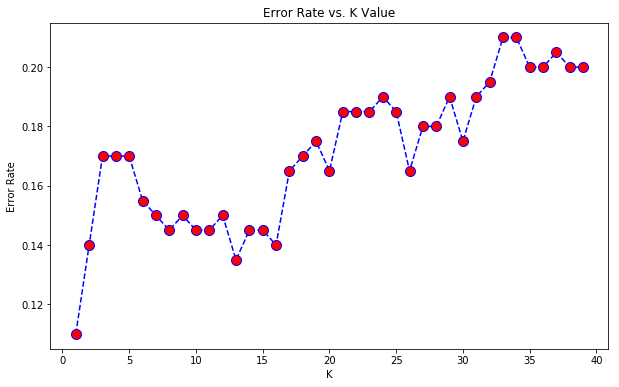

In [64]:
import numpy as np 
import matplotlib.pyplot as plt

error_rate = []

for i in range(1,40):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(Xo_train,yo_train)
    pred_i = knn.predict(Xo_test)
    error_rate.append(np.mean(pred_i != yo_test))

plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

Função de peso usada na previsão. Valores possíveis:

'Uniforme': pesos uniformes. Todos os pontos em cada neighborhood são ponderados igualmente.

'Distância': pontos de dados ponderados pelo inverso da distância. Nesse caso, os vizinhos mais próximos de um ponto de consulta terão uma influência maior do que os vizinhos mais distantes.

(callable): uma função definida pelo usuário que aceita uma matriz de distâncias e retorna uma matriz da mesma forma que contém os pesos.

Parâmetro de potência para a métrica Minkowski. Quando p = 1, isso equivale a usar manhattan_distance (l1) e euclidean_distance (l2) para p = 2. Para p arbitrário, minkowski_distance (l_p) é usado.

In [65]:
# Com K = 1 

knn = KNeighborsClassifier(n_neighbors=1, weights='distance',p=1)

knn.fit(Xo_train,yo_train)
pred = knn.predict(Xo_test)

print('Com K = 1')
print('\n')
print('Confusion Matrix')
cm_knn = confusion_matrix(yo_test,pred)
print(cm_knn)
print('\n')
rpt_knn = classification_report(yo_test,pred)
print(rpt_knn)

Com K = 1


Confusion Matrix
[[88 15]
 [ 6 91]]


             precision    recall  f1-score   support

          0       0.94      0.85      0.89       103
          1       0.86      0.94      0.90        97

avg / total       0.90      0.90      0.89       200



### 6.4 - Seleção de recursos usando o método Hill climbing

In [66]:
from sklearn.utils import shuffle
new_Ind = []

In [67]:
cur_MaxScore = 0.0

In [68]:
col_num = 8

In [69]:
col_Ind_Random = shuffle(range(0,col_num), random_state=13)

In [70]:
for cur_f in range(0, col_num):
    new_Ind.append(col_Ind_Random[cur_f])
    newData = data.values[:, new_Ind]
    Xs_train, Xs_test, ys_train, ys_test = train_test_split(newData, target, test_size=0.2, random_state=1987)
    clf = KNeighborsClassifier(1)
    fit = clf.fit(Xs_train, ys_train)
    cur_Score = clf.score(Xs_test, ys_test)
    if cur_Score < cur_MaxScore:
        new_Ind.remove(col_Ind_Random[cur_f])
    else:
        cur_MaxScore = cur_Score
        print ("Score com " + str(len(new_Ind)) + " atributos selecionados: " + str(cur_Score))

Score com 1 atributos selecionados: 0.6493506493506493
Score com 2 atributos selecionados: 0.7922077922077922
Score com 3 atributos selecionados: 0.8051948051948052
Score com 4 atributos selecionados: 0.8181818181818182


Text(0, 0.5, 'Error Rate')

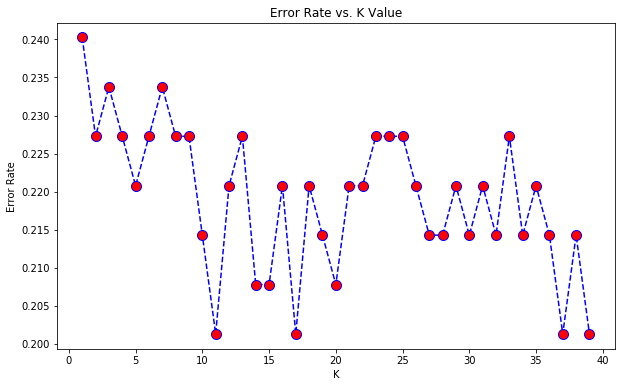

In [71]:
error_rate = []
random_state=19
for i in range(1,40):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(Xs_train,ys_train)
    pred_i = knn.predict(Xs_test)
    error_rate.append(np.mean(pred_i != ys_test))

plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

In [72]:
knn = KNeighborsClassifier(n_neighbors=9, weights='distance',p=1)

knn.fit(Xs_train,ys_train)
pred = knn.predict(Xs_test)

print('WITH K=31')
print('\n')
print('Confusion Matrix')
cm_knn = confusion_matrix(ys_test,pred)
print(cm_knn)
print('\n')
rpt_knn = classification_report(ys_test,pred)
print(rpt_knn)

WITH K=31


Confusion Matrix
[[90 11]
 [16 37]]


             precision    recall  f1-score   support

          0       0.85      0.89      0.87       101
          1       0.77      0.70      0.73        53

avg / total       0.82      0.82      0.82       154



### 7.5 - KNN Sem SMOTE

Text(0, 0.5, 'Error Rate')

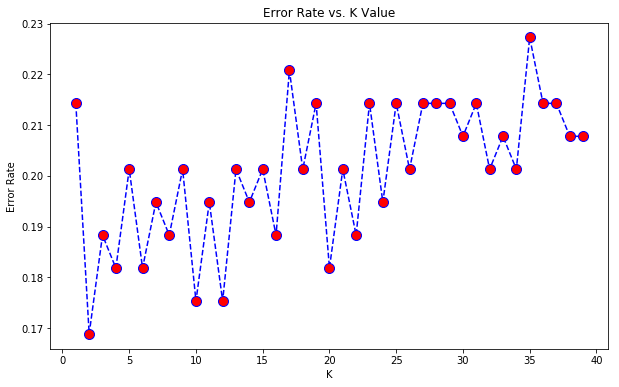

In [73]:
error_rate = []

for i in range(1,40):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

In [74]:
knn = KNeighborsClassifier(n_neighbors=30, weights='distance',p=1)

knn.fit(X_train,y_train)
pred = knn.predict(X_test)

print('Com K = 31')
print('\n')
print('Confusion Matrix')
cm_knn = confusion_matrix(y_test,pred)
print(cm_knn)
print('\n')
rpt_knn = classification_report(y_test,pred)
print(rpt_knn)

Com K = 31


Confusion Matrix
[[83 17]
 [10 44]]


             precision    recall  f1-score   support

          0       0.89      0.83      0.86       100
          1       0.72      0.81      0.77        54

avg / total       0.83      0.82      0.83       154



### 7.6 - Decision Tree Classifier

In [75]:
from sklearn.tree import DecisionTreeClassifier
random_state=848
dtree = DecisionTreeClassifier(random_state=84048)

In [76]:
dtree.fit(X_train,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False,
            random_state=84048, splitter='best')

In [77]:
pred = dtree.predict(X_test)
print("Acurácia para o algoritmo decision tree classifier é",metrics.accuracy_score(pred,y_test))

Acurácia para o algoritmo decision tree classifier é 0.7597402597402597


### 7.7 - Matrix de Confusão

In [78]:
print('Confusion Matrix')
cm_dtree = confusion_matrix(y_test,pred)
print(cm_dtree)
print('\n')
rpt_dtree = classification_report(y_test,pred)
print(rpt_dtree)

Confusion Matrix
[[79 21]
 [16 38]]


             precision    recall  f1-score   support

          0       0.83      0.79      0.81       100
          1       0.64      0.70      0.67        54

avg / total       0.77      0.76      0.76       154



In [79]:
feat_names = df.copy().iloc[:, 0:8].columns
targ_names = ['Yes','No']

In [80]:
import graphviz
from graphviz import Source

from sklearn import tree
from sklearn.tree import DecisionTreeClassifier,export_graphviz

dot_data = export_graphviz(dtree,
                        out_file="diabetics.dot",
                        feature_names=feat_names,
                        class_names=targ_names,
                        filled=True, 
                        rounded=True,  
                        special_characters=True)

#graph = graphviz.Source(dot_data) 
#graph.render("diabests",view = True)

from subprocess import call
call(['dot', '-Tpng', 'diabetics.dot', '-o', 'diabetics.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'diabetics.png')

### 7.8 - Random Forest Classifier

In [81]:
from sklearn.ensemble import RandomForestClassifier

In [82]:
# Número de estimadores de árvore de decisão base
n_est = 100

# Profundidade máxima de qualquer estimador de árvore de decisão
max_depth = 5

# Variável de estado aleatório
rstate = 42

# Inicializar um algoritmo de floresta aleatória
rf = RandomForestClassifier(n_estimators=n_est, 
                             max_depth=max_depth,
                             random_state=rstate)

In [83]:
rf.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=5, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=False, random_state=42, verbose=0, warm_start=False)

In [84]:
pred = rf.predict(X_test)

In [85]:
print('Confusion Matrix')
cm_rf = confusion_matrix(y_test,pred)
print(cm_rf)
print('\n')
rpt_rf = classification_report(y_test,pred)
print(rpt_rf)

Confusion Matrix
[[84 16]
 [10 44]]


             precision    recall  f1-score   support

          0       0.89      0.84      0.87       100
          1       0.73      0.81      0.77        54

avg / total       0.84      0.83      0.83       154



In [86]:
# Lista de colunas a serem usadas para treinar cada modelo
features = [col for col in list(X_train) ]
print('%i features (atributos): %s' % (len(features), features))

8 features (atributos): ['Pregnancy', 'Glucose', 'BloodPressure', 'SkinfoldThickness', 'Insulin', 'BodyMassIndex', 'DiabetesPedigreeFunction', 'Age']


In [87]:
# Relatório com os recursos mais importantes para prever variável target

# Coletar ranking dos recursos mais "importantes" para E
importances =  rf.feature_importances_
descending_indices = np.argsort(importances)[::-1]
sorted_importances = [importances[idx] for idx in descending_indices]
sorted_features = [features[idx] for idx in descending_indices]
print('A característica mais importante para o diabetes é %s' % sorted_features[0])

A característica mais importante para o diabetes é Insulin


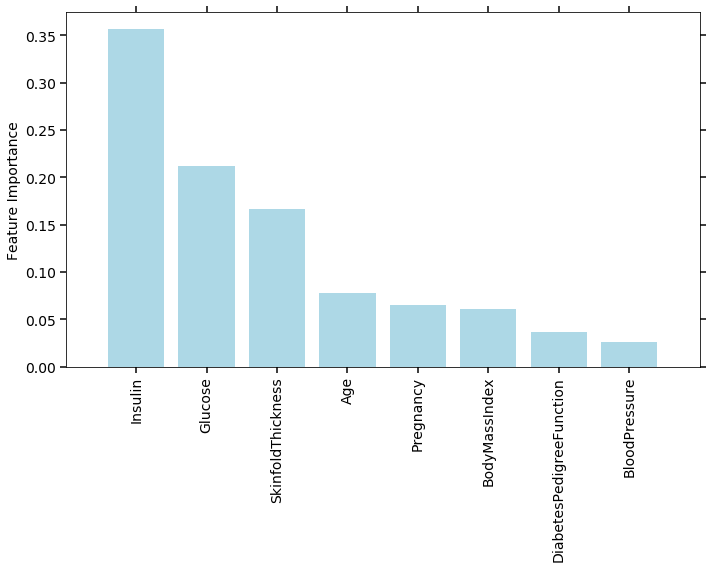

In [88]:
# Plot dos recursos mais importantes

def plot_importances(X_train, sorted_features, sorted_importances):

    axis_width = 1.5
    maj_tick_len = 6
    fontsize = 14
    bar_color = 'lightblue'
    align = 'center'
    label = '__nolegend__'
    ax = plt.bar(range(X_train.shape[1]), sorted_importances, color=bar_color, align=align, label=label)
    ax = plt.xticks(range(X_train.shape[1]), sorted_features, rotation=90)
    ax = plt.xlim([-1, X_train.shape[1]])
    ax = plt.ylabel('Feature Importance', fontsize=fontsize)
    ax = plt.tick_params('both', length=maj_tick_len, width=axis_width, which='major', right=True, top=True)
    ax = plt.xticks(fontsize=fontsize)
    ax = plt.yticks(fontsize=fontsize)
    ax = plt.tight_layout()
    return ax

fig1 = plt.figure(1, figsize=(10,8))

ax = plot_importances(X_train, sorted_features, sorted_importances)

# plt.tight_layout()
plt.show()
plt.close()

### 7.9 - Comparação dos modelos

In [89]:
temp=[]
classifier=['Decision Tree','Random Forest','KNN','KNN (Smote)']
models=[DecisionTreeClassifier(random_state=998),RandomForestClassifier(n_estimators=n_est, 
                             max_depth=max_depth,
                             random_state=rstate),KNeighborsClassifier(n_neighbors=6),"SMOTE"]
for i in models:
    model = i
    if model == "SMOTE":
        model = KNeighborsClassifier(n_neighbors=1,weights='distance',p=1)
        model.fit(Xo_train,yo_train)
        pred1=model.predict(Xo_test)
        temp.append(metrics.accuracy_score(pred1,yo_test))
    else:
        model.fit(X_train,y_train)
        prediction=model.predict(X_test)    
        temp.append(metrics.accuracy_score(prediction,y_test))
        
models_dataframe=pd.DataFrame(temp,index=classifier)   
models_dataframe.columns=['Accuracy']
models_dataframe

,Accuracy
Decision Tree,0.753247
Random Forest,0.831169
KNN,0.818182
KNN (Smote),0.895000


### 7.10 - Usando Apenas as Features Mais Importantes

In [90]:
diab2=df[['Pregnancy','Glucose','SkinfoldThickness','Insulin','BodyMassIndex','Age','Class']]

train1,test1=train_test_split(diab2,test_size=0.20,random_state=437,stratify=diab2['Class'])

X_train=train1[train1.columns[:6]]
X_test=test1[test1.columns[:6]]
y_train=train1['Class']
y_test=test1['Class']

# SMOTE
np.random.seed(795)
data1, target1 = SMOTE().fit_sample(diab2, diab2.Class)
Xo_train, Xo_test, yo_train, yo_test = train_test_split(data1, target1, test_size=0.20, random_state=4)

## 8. Interpretação dos Resultados

In [91]:
temp=[]
classifier=['Decision Tree','Random Forest','KNN','KNN (Smote)']
models=[DecisionTreeClassifier(random_state=998),RandomForestClassifier(n_estimators=n_est, 
                             max_depth=max_depth,
                             random_state=rstate),KNeighborsClassifier(n_neighbors=6),"SMOTE"]
for i in models:
    model = i
    if model == "SMOTE":
        model = KNeighborsClassifier(n_neighbors=1,weights='distance',p=1)
        model.fit(Xo_train,yo_train)
        pred1=model.predict(Xo_test)
        temp.append(metrics.accuracy_score(pred1,yo_test))
    else:
        model.fit(X_train,y_train)
        prediction=model.predict(X_test)    
        temp.append(metrics.accuracy_score(prediction,y_test))
        
models_dataframe=pd.DataFrame(temp,index=classifier)   
models_dataframe.columns=['Accuracy']
models_dataframe

,Accuracy
Decision Tree,0.850649
Random Forest,0.902597
KNN,0.850649
KNN (Smote),0.880000


### 8.1 - Cross validation

In [92]:
from sklearn.model_selection import KFold 
from sklearn.model_selection import cross_val_score 
kfold = KFold(n_splits=10, random_state=998) 

In [93]:
temp=[]
accuracy=[]
classifiers=['KNN','KNN (SMOTE)','Decision Tree','Random Forest']
models=[KNeighborsClassifier(n_neighbors=6),"SMOTE", DecisionTreeClassifier(),RandomForestClassifier(n_estimators=n_est, 
                             max_depth=max_depth,
                             random_state=938)]
for i in models:
    model = i
    
    if model == "SMOTE":
        model = KNeighborsClassifier(n_neighbors=1,weights='distance',p=1)
        cv_result = cross_val_score(model,data_o,target_o, cv = kfold,scoring = "accuracy")
        temp.append(cv_result.mean())
        accuracy.append(cv_result)
       
    else:
        cv_result = cross_val_score(model,data,target, cv = kfold,scoring = "accuracy")
        temp.append(cv_result.mean())
        accuracy.append(cv_result)
new_models_dataframe2=pd.DataFrame(temp,index=classifiers)   
new_models_dataframe2.columns=['CV Mean']    
new_models_dataframe2

,CV Mean
KNN,0.753794
KNN (SMOTE),0.904000
Decision Tree,0.802085
Random Forest,0.871138


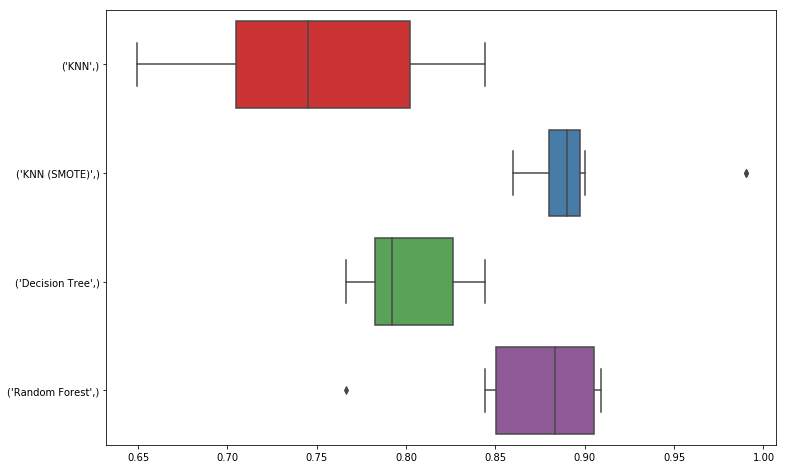

In [94]:
box=pd.DataFrame(accuracy,index=[classifiers])
fig3 = plt.figure(1, figsize=(12,8))
sns.boxplot(data=box.T, orient="h", palette="Set1")
plt.show()

### 8.2 - Tuning de Parâmetros Para o Random Forest

In [95]:
from pprint import pprint
print('Parâmetros atualmente em uso:\n')
pprint(rf.get_params())

Parâmetros atualmente em uso:

{'bootstrap': True,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 5,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': 1,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}


In [96]:
from sklearn.model_selection import RandomizedSearchCV

# Número de árvores em floresta aleatória
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]

# Número de recursos a serem considerados em cada divisão
max_features = ['auto', 'sqrt']

# Número máximo de níveis na árvore
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

# Número mínimo de amostras necessárias para dividir um nó
min_samples_split = [2, 5, 10]

# Número mínimo de amostras requeridas em cada nó da folha
min_samples_leaf = [1, 2, 4]

# Método de seleção de amostras para treinar cada árvore
bootstrap = [True, False]

# Cria o random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
pprint(random_grid)

{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


In [97]:
## ATENÇÃO! Esse processo demora muito

# Use randim grid para procurar os melhores hiperparâmetros
# Primeiro crie o modelo básico para ajustar
rf = RandomForestClassifier()

# Pesquisa aleatória de parâmetros, usando validação cruzada 3 vezes,
# Pesquisar em 100 combinações diferentes e usar todos os núcleos disponíveis
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)

# Fit 
rf_random.fit(X_train, y_train)


Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV] n_estimators=400, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=30, bootstrap=True 
[CV] n_estimators=400, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=30, bootstrap=True 
[CV] n_estimators=2000, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=True 
[CV] n_estimators=400, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=30, bootstrap=True 
[CV]  n_estimators=400, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=30, bootstrap=True, total=   1.4s
[CV] n_estimators=2000, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=True 
[CV]  n_estimators=400, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=30, bootstrap=True, total=   1.4s
[CV] n_estimators=2000, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=True 


[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   37.4s


[CV]  n_estimators=800, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=90, bootstrap=False, total=   3.1s
[CV] n_estimators=2000, min_samples_split=10, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=False 
[CV]  n_estimators=800, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=90, bootstrap=False, total=   3.1s
[CV] n_estimators=2000, min_samples_split=10, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=False 
[CV]  n_estimators=800, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=90, bootstrap=False, total=   3.0s
[CV] n_estimators=1600, min_samples_split=5, min_samples_leaf=2, max_features=sqrt, max_depth=10, bootstrap=False 
[CV]  n_estimators=2000, min_samples_split=10, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=False, total=   7.1s
[CV] n_estimators=1600, min_samples_split=5, min_samples_leaf=2, max_features=sqrt, max_depth=10, bootstrap=False 
[CV]  n_estimators=2

[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  2.9min


[CV]  n_estimators=1000, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=50, bootstrap=False, total=   3.6s
[CV] n_estimators=1000, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=50, bootstrap=False 
[CV]  n_estimators=1000, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=50, bootstrap=False, total=   3.5s
[CV] n_estimators=1000, min_samples_split=5, min_samples_leaf=4, max_features=auto, max_depth=30, bootstrap=False 
[CV]  n_estimators=2000, min_samples_split=10, min_samples_leaf=2, max_features=auto, max_depth=50, bootstrap=False, total=   7.1s
[CV] n_estimators=1000, min_samples_split=5, min_samples_leaf=4, max_features=auto, max_depth=30, bootstrap=False 
[CV]  n_estimators=2000, min_samples_split=10, min_samples_leaf=2, max_features=auto, max_depth=50, bootstrap=False, total=   7.2s
[CV] n_estimators=1000, min_samples_split=5, min_samples_leaf=4, max_features=auto, max_depth=30, bootstrap=False 
[CV]  n_estimat

[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  5.7min finished


RandomizedSearchCV(cv=3, error_score='raise',
          estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
          fit_params=None, iid=True, n_iter=100, n_jobs=-1,
          param_distributions={'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]},
          pre_dispatch='2*n_jobs', random_state=42, refit=True,
          return_train_score='warn', scoring=None, verbose=2)

In [98]:
rf_random.best_params_

{'n_estimators': 400,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 30,
 'bootstrap': True}

In [99]:
def evaluate(model, X_test, y_test):
    predictions = model.predict(X_test)
    errors = abs(predictions - y_test)
    mape = 100 * np.mean(errors)
    accuracy = 100 - mape
    print('Model Performance')
    print('Average Error: {:0.4f} degrees.'.format(np.mean(errors)))
    print('Accuracy = {:0.2f}%.'.format(accuracy))
    
    return accuracy

In [100]:
base_model = RandomForestClassifier(random_state = 82)
base_model.fit(X_train, y_train)
base_accuracy = evaluate(base_model, X_test, y_test)

Model Performance
Average Error: 0.1299 degrees.
Accuracy = 87.01%.


In [101]:
best_random = rf_random.best_estimator_
random_accuracy = evaluate(best_random, X_test, y_test)

Model Performance
Average Error: 0.1234 degrees.
Accuracy = 87.66%.


In [102]:
print('Melhora de {:0.2f}%.'.format( 100 * (random_accuracy - base_accuracy) / base_accuracy))

Melhora de 0.75%.


### 8.3 - Tuning de Parâmetros Para Decision Tree

In [103]:
from pprint import pprint
print('Parâmetros atualmente em uso:\n')
pprint(dtree.get_params())

Parâmetros atualmente em uso:

{'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'presort': False,
 'random_state': 84048,
 'splitter': 'best'}


In [104]:
from sklearn.model_selection import RandomizedSearchCV

# Número de recursos a serem considerados em cada divisão
max_features = ['auto', 'sqrt']

# Número máximo de níveis na árvore
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

# Número mínimo de amostras necessárias para dividir um nó
min_samples_split = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]

# Número mínimo de amostras requeridas em cada nó da folha
min_samples_leaf = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

# Método de seleção de amostras para treinar cada árvore
bootstrap = [True, False]

random_state=294

# Cria o random grid
random_grid = {
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               }
pprint(random_grid)

{'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
 'min_samples_split': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]}


In [105]:
## ATENÇÃO! Esse processo demora muito

# Use random grid para procurar os melhores hiperparâmetros
# Primeiro crie o modelo básico para ajustar
dtree = DecisionTreeClassifier()
random_state=194

# Pesquisa aleatória de parâmetros, usando validação cruzada de 3
# Pesquisar em 100 combinações diferentes e usar todos os núcleos disponíveis
dtree_random = RandomizedSearchCV(estimator = dtree, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=294, n_jobs = -1)

# Fit
dtree_random.fit(X_train, y_train)


Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV] min_samples_split=7, min_samples_leaf=7, max_features=auto, max_depth=40 
[CV] min_samples_split=7, min_samples_leaf=7, max_features=auto, max_depth=40 
[CV]  min_samples_split=7, min_samples_leaf=7, max_features=auto, max_depth=40, total=   0.0s
[CV] min_samples_split=12, min_samples_leaf=4, max_features=auto, max_depth=90 
[CV] min_samples_split=7, min_samples_leaf=7, max_features=auto, max_depth=40 
[CV]  min_samples_split=7, min_samples_leaf=7, max_features=auto, max_depth=40, total=   0.0s
[CV] min_samples_split=12, min_samples_leaf=4, max_features=auto, max_depth=90 
[CV]  min_samples_split=12, min_samples_leaf=4, max_features=auto, max_depth=90, total=   0.0s
[CV] min_samples_split=12, min_samples_leaf=4, max_features=auto, max_depth=90 
[CV] min_samples_split=8, min_samples_leaf=5, max_features=sqrt, max_depth=None 
[CV]  min_samples_split=7, min_samples_leaf=7, max_features=auto, max_depth=40, total=   0.0s
[C

[Parallel(n_jobs=-1)]: Done 208 tasks      | elapsed:    1.6s


[CV]  min_samples_split=9, min_samples_leaf=1, max_features=sqrt, max_depth=60, total=   0.0s
[CV]  min_samples_split=2, min_samples_leaf=7, max_features=sqrt, max_depth=110, total=   0.0s
[CV] min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=80 
[CV]  min_samples_split=5, min_samples_leaf=2, max_features=auto, max_depth=50, total=   0.0s
[CV] min_samples_split=16, min_samples_leaf=6, max_features=auto, max_depth=50 
[CV] min_samples_split=5, min_samples_leaf=2, max_features=auto, max_depth=50 
[CV]  min_samples_split=16, min_samples_leaf=7, max_features=sqrt, max_depth=60, total=   0.0s
[CV] min_samples_split=16, min_samples_leaf=7, max_features=sqrt, max_depth=60 
[CV]  min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=80, total=   0.0s
[CV]  min_samples_split=16, min_samples_leaf=6, max_features=auto, max_depth=50, total=   0.0s
[CV] min_samples_split=16, min_samples_leaf=6, max_features=auto, max_depth=50 
[CV] min_samples_split=5, min_sampl

[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    2.1s finished


RandomizedSearchCV(cv=3, error_score='raise',
          estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
          fit_params=None, iid=True, n_iter=100, n_jobs=-1,
          param_distributions={'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16], 'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]},
          pre_dispatch='2*n_jobs', random_state=294, refit=True,
          return_train_score='warn', scoring=None, verbose=2)

In [106]:
dtree_random.best_params_

{'min_samples_split': 11,
 'min_samples_leaf': 3,
 'max_features': 'auto',
 'max_depth': 80}

In [107]:
base_model =  DecisionTreeClassifier(min_samples_leaf=2, min_samples_split=3,random_state=474)
base_model.fit(X_train, y_train)
base_accuracy = evaluate(base_model, X_test, y_test)

Model Performance
Average Error: 0.1753 degrees.
Accuracy = 82.47%.


In [108]:
pprint(base_model.get_params())

{'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 2,
 'min_samples_split': 3,
 'min_weight_fraction_leaf': 0.0,
 'presort': False,
 'random_state': 474,
 'splitter': 'best'}


In [109]:
best_dtree_random = dtree_random.best_estimator_
best_dtree_random.fit(X_train, y_train)
random_accuracy = evaluate(best_dtree_random, X_test, y_test)

Model Performance
Average Error: 0.1558 degrees.
Accuracy = 84.42%.


In [110]:
print('Melhora de {:0.2f}%.'.format( 100 * (random_accuracy - base_accuracy) / base_accuracy))

Melhora de 2.36%.


In [111]:
best_dtree_random

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=80,
            max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=3, min_samples_split=11,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

## 9. Apresentação dos Resultados

In [112]:
dot_data = tree.export_graphviz(best_dtree_random, out_file='tree2.dot', 
                         filled=True, rounded=True,  
                         special_characters=True) 

In [113]:
temp=[]
accuracy=[]
classifiers=['KNN','KNN (SMOTE)','Decision Tree','Random Forest']
models=[KNeighborsClassifier(n_neighbors=6),"SMOTE", best_dtree_random,best_random]
for i in models:
    model = i
    
    if model == "SMOTE":
        model = KNeighborsClassifier(n_neighbors=1,weights='distance',p=1)
        cv_result = cross_val_score(model,data_o,target_o, cv = kfold,scoring = "accuracy")
        temp.append(cv_result.mean())
        accuracy.append(cv_result)
       
    else:
        cv_result = cross_val_score(model,data,target, cv = kfold,scoring = "accuracy")
        temp.append(cv_result.mean())
        accuracy.append(cv_result)
new_models_dataframe2=pd.DataFrame(temp,index=classifiers)   
new_models_dataframe2.columns=['CV Mean']    
new_models_dataframe2

,CV Mean
KNN,0.753794
KNN (SMOTE),0.904000
Decision Tree,0.805895
Random Forest,0.871121


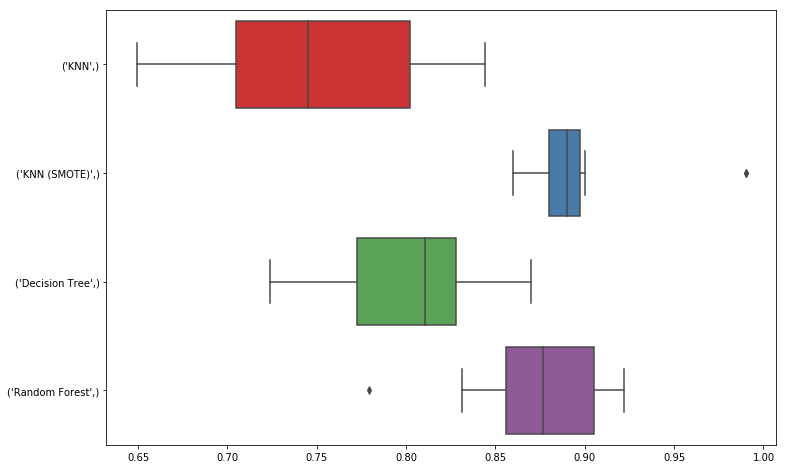

In [114]:
box=pd.DataFrame(accuracy,index=[classifiers])
fig3 = plt.figure(1, figsize=(12,8))
sns.boxplot(data=box.T, orient="h", palette="Set1")
plt.show()

In [115]:
# Melhor resultado de saída KNN (SMOTE)	0.904000

pred1

array([0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1,
       0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1,
       1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0,
       1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0,
       0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1,
       1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0,
       1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1,
       0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0,
       1, 1])